In [12]:
import os
from typing import Callable, Dict

import matplotlib
import numpy as np
import pandas as pd
import polars as pl
import scipy
from scipy import spatial
import seaborn as sns
import sklearn
from matplotlib import pyplot as plt
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.preprocessing import normalize
from tqdm import tqdm
%matplotlib inline

In [2]:
DATA_DIR = "data/counts/matrices/"

In [3]:
mutations_df = pd.read_csv(
    "data/counts/matrices/sigmatrix_96.csv",
    index_col=0
)
mutations_df.shape

(96, 569)

In [4]:
mutations_df

,DO217786,DO217787,DO217788,DO217800,DO217826,DO217844,DO217865,DO217887,DO217907,DO217908,...,DO225389,DO225390,DO225391,DO225392,DO225393,DO225394,DO225395,DO225396,DO225397,DO225398
MutationType,,,,,,,,,,,,,,,,,,,,,
A[C>A]A,379,241,194,47,202,298,373,135,396,184,...,133,466,264,187,81,60,316,159,117,304
A[C>A]C,249,140,291,61,181,146,239,156,548,158,...,131,371,74,163,103,85,329,122,100,327
A[C>A]G,60,73,68,32,57,135,47,30,75,14,...,24,84,38,23,53,5,55,11,16,35
A[C>A]T,249,175,242,19,123,139,109,55,301,83,...,137,339,102,177,34,47,220,117,154,294
A[C>G]A,97,117,128,30,52,324,118,42,258,73,...,184,495,230,159,42,59,364,106,61,251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T[T>C]T,360,196,262,64,189,184,166,128,664,73,...,156,320,63,232,44,104,502,122,140,206
T[T>G]A,96,58,92,14,28,62,52,52,190,42,...,113,193,39,115,28,50,341,46,76,97
T[T>G]C,83,77,79,8,39,42,31,13,72,145,...,43,150,30,33,23,8,451,21,17,62


In [5]:
cosmic = pd.read_csv(
    "data/cosmic/COSMIC_v3.4_SBS_GRCh37.txt", sep="\t"
).rename(
    {"Type": "MutationType"}, axis="columns"
).set_index("MutationType")
cosmic.shape

(96, 86)

In [6]:
cosmic.head()

,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,SBS7b,SBS7c,SBS7d,...,SBS90,SBS91,SBS92,SBS93,SBS94,SBS95,SBS96,SBS97,SBS98,SBS99
MutationType,,,,,,,,,,,,,,,,,,,,,
A[C>A]A,0.000886,5.800000e-07,0.020808,0.042196,0.011998,0.000425,0.000067,0.002329,0.004830,0.000040,...,0.002202,0.002945,0.011329,0.011573,0.015580,0.038408,0.011431,0.008159,0.008804,0.000004
A[C>A]C,0.002280,1.480040e-04,0.016507,0.033297,0.009438,0.000524,0.000179,0.000461,0.001150,0.000765,...,0.000708,0.052997,0.009745,0.008096,0.024746,0.017384,0.007771,0.007513,0.006769,0.000007
A[C>A]G,0.000177,5.230000e-05,0.001751,0.015599,0.001850,0.000052,0.000071,0.000186,0.000377,0.000250,...,0.000139,0.000204,0.004697,0.001761,0.001574,0.008360,0.001997,0.001375,0.032959,0.000051
A[C>A]T,0.001280,9.780000e-05,0.012205,0.029498,0.006609,0.000180,0.000248,0.000710,0.001960,0.004049,...,0.001755,0.000131,0.007758,0.008421,0.011076,0.023294,0.011809,0.006858,0.003758,0.000031
A[C>G]A,0.001860,2.230000e-16,0.019708,0.006889,0.010098,0.000471,0.000065,0.000009,0.001120,0.001180,...,0.000508,0.000243,0.003056,0.008857,0.007004,0.003617,0.009295,0.002347,0.006897,0.000446


In [7]:
np.all(mutations_df.index == cosmic.index)

True

In [8]:
cosmic.sum(axis="rows")

SBS1     1.0
SBS2     1.0
SBS3     1.0
SBS4     1.0
SBS5     1.0
        ... 
SBS95    1.0
SBS96    1.0
SBS97    1.0
SBS98    1.0
SBS99    1.0
Length: 86, dtype: float64

<Axes: ylabel='MutationType'>

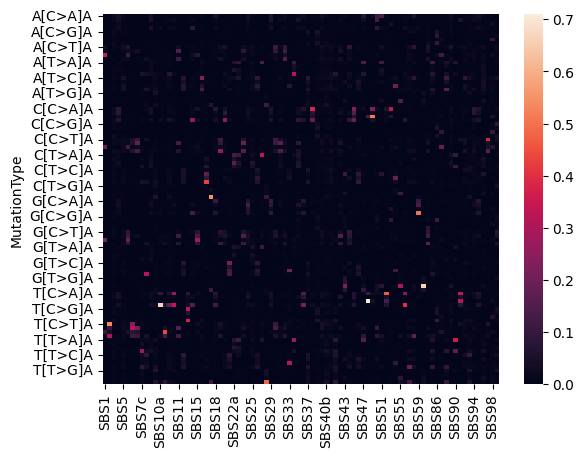

In [9]:
sns.heatmap(cosmic)

In [10]:
default_rcparams = plt.rcParams

# Simple baselines
------------------------------


## 1. NMF

In [11]:
N_CATEGORIES, N_PATIENTS, N_SIGNATURES = *mutations_df.shape, cosmic.shape[1]
N_CATEGORIES, N_PATIENTS, N_SIGNATURES

(96, 569, 86)

### NMF under Frobenius norm
(optimal assuming Gaussian noise)

In [16]:
# NMF with Frobenius norm
nmf = NMF(
    n_components=N_SIGNATURES,
    random_state=2137,
    init="nndsvdar",
    solver="cd",
    beta_loss="frobenius",
    # alpha_W=0.00005,
    # alpha_H=0.00005,
    # l1_ratio=0.5,
    verbose=1,
    max_iter=10_000
)
E = nmf.fit_transform(mutations_df.transpose())
P = nmf.components_

violation: 1.0
violation: 0.1566708004356755
violation: 0.06342652734599258
violation: 0.03804297355969991
violation: 0.02780833519808408
violation: 0.021233191057740203
violation: 0.017170897438476607
violation: 0.014310297173593257
violation: 0.01231184463985224
violation: 0.01079189748168046
violation: 0.009657553750047707
violation: 0.008823694126436804
violation: 0.008130724102609715
violation: 0.007580885233188377
violation: 0.007144266040838269
violation: 0.006764860510291899
violation: 0.006376161962355015
violation: 0.006034922866915908
violation: 0.005754494336022047
violation: 0.0054784313853407035
violation: 0.00525416291796196
violation: 0.005052038485967319
violation: 0.004872116621374554
violation: 0.004691171903162742
violation: 0.00452151373886257
violation: 0.004364244615226936
violation: 0.0042249936326814695
violation: 0.0040917395418099516
violation: 0.003976029642083395
violation: 0.003862048326947752
violation: 0.0037534155814472592
violation: 0.00364964633409057

In [17]:
E.shape, P.shape

((569, 86), (86, 96))

In [18]:
(E@P).shape

(569, 96)

In [19]:
nmf.reconstruction_err_

1542.0349485020533

In [19]:
mutations_np = mutations_df.transpose().to_numpy()
np.abs(E@P - mutations_np).mean()

3.0442025721179338

<Axes: >

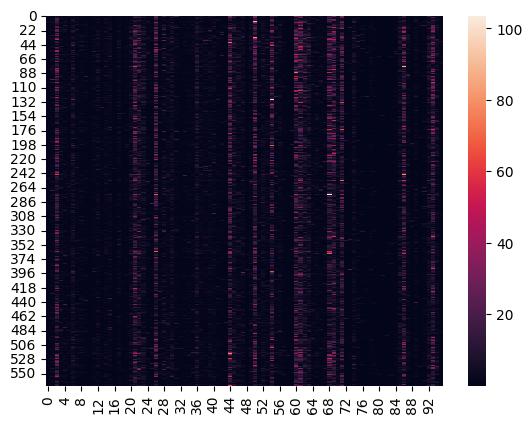

In [20]:
sns.heatmap(np.abs(E@P - mutations_np).clip(0, 1000))

In [21]:
P_prob = P / P.sum(axis=1, keepdims=True)
P_prob.shape

(86, 96)

In [42]:
def get_nearest_signatures(
    discovered_signatures: pd.DataFrame | np.ndarray, 
    reference_signatures: pd.DataFrame,
    distance_function: Callable = scipy.spatial.distance.jensenshannon
) -> Dict[int, str]:
    return {
    i: reference_signatures.iloc[:, np.argmin(
        [distance_function(discovered_signatures[i], reference_signatures.iloc[:,j]) 
         for j in range(N_SIGNATURES)]
    )].name
    for i in range(N_SIGNATURES)
}

In [94]:
cosmic.shape, N_SIGNATURES

((96, 86), 86)

In [46]:
nearest_signatures = get_nearest_signatures(P_prob, cosmic)

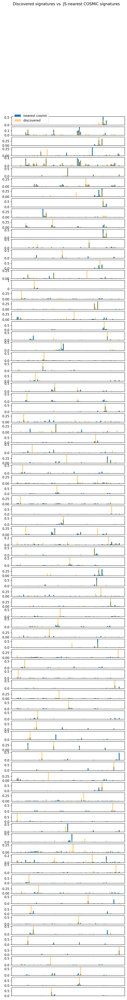

In [47]:
plt.rcParams["figure.dpi"] = 240
plt.rcParams['figure.figsize'] = [6.4, 50]

n_plots = N_SIGNATURES
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Discovered signatures vs. JS-nearest COSMIC signatures")
for i in range(n_plots):
    nearest_cosmic = cosmic[nearest_signatures[i]]
    axs[i].bar(nearest_cosmic.index, nearest_cosmic, label="nearest cosmic")
    axs[i].bar(nearest_cosmic.index, P_prob[i], color="orange", alpha=0.5, label="discovered")
    axs[i].set_xticks([])
    if i == 0:
        axs[i].legend()

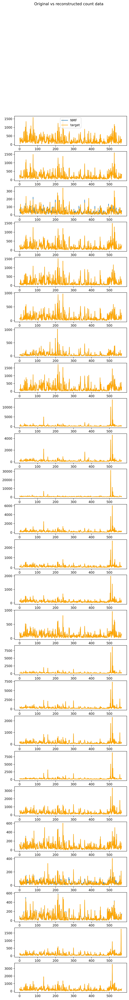

In [24]:
n_plots = 25
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Original vs reconstructed count data")
for i in range(n_plots):
    axs[i].plot(E@P[:,i], label="NMF")
    axs[i].plot(mutations_np[:,i], color="orange", label="target")
    if i == 0:
        axs[i].legend()

In [25]:
scores_nmf = []
for i in tqdm(range(40, 100, 5)):
    # NMF with Frobenius norm
    nmf = NMF(
        n_components=i,
        random_state=2137,
        init="nndsvdar",
        solver="cd",
        beta_loss="frobenius",
        max_iter=10_000
    )
    _ = nmf.fit_transform(mutations_df.transpose())
    scores_nmf.append(nmf.reconstruction_err_)

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 9/12 [01:27<00:42, 14.12s/it]/home/rj/masters-mimuw/env/lib/python3.11/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 10000 reached. Increase it to improve convergence.
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [03:02<00:00, 15.17s/it]


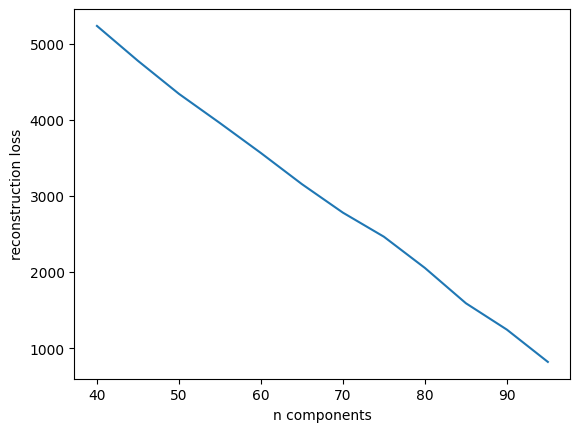

In [30]:
plt.plot(list(range(40, 100, 5)), scores_nmf)
plt.xlabel("n components")
plt.ylabel("reconstruction loss")
plt.show()

In [35]:
# NMF with Frobenius norm
nmf = NMF(
    n_components=15,
    random_state=2137,
    init="nndsvdar",
    solver="cd",
    beta_loss="frobenius",
    # alpha_W=0.00005,
    # alpha_H=0.00005,
    # l1_ratio=0.5,
    verbose=1,
    max_iter=10_000
)
E = nmf.fit_transform(mutations_df.transpose())
P = nmf.components_

violation: 1.0
violation: 0.24710822709992336
violation: 0.14570389732944997
violation: 0.0825060356864376
violation: 0.05438616836530824
violation: 0.04054372104701022
violation: 0.0330667884200371
violation: 0.028284331351624056
violation: 0.024710649991544268
violation: 0.02169138972805921
violation: 0.019302508875041653
violation: 0.017370022333932752
violation: 0.015657083899592174
violation: 0.014125872172753141
violation: 0.012806327320319714
violation: 0.011752397251888548
violation: 0.010915219632903041
violation: 0.010136188046430258
violation: 0.009382321330046614
violation: 0.00867059644724978
violation: 0.008126096167311438
violation: 0.0076339251629605216
violation: 0.007196576013902481
violation: 0.006784616248813885
violation: 0.0064106918291183005
violation: 0.006074038107384903
violation: 0.005766362642121049
violation: 0.005463426524265705
violation: 0.005206733028251864
violation: 0.004980229970007171
violation: 0.0047790981500662605
violation: 0.0045832848970354095

In [43]:
P_prob = P / P.sum(axis=1, keepdims=True)
nearest_signatures = get_nearest_signatures(P_prob, cosmic)

In [44]:
nearest_signatures

{0: 'SBS2',
 1: 'SBS6',
 2: 'SBS13',
 3: 'SBS3',
 4: 'SBS44',
 5: 'SBS17b',
 6: 'SBS26',
 7: 'SBS13',
 8: 'SBS36',
 9: 'SBS2',
 10: 'SBS30',
 11: 'SBS2',
 12: 'SBS15',
 13: 'SBS54',
 14: 'SBS86',
 15: 'SBS34',
 16: 'SBS16',
 17: 'SBS39',
 18: 'SBS52',
 19: 'SBS40a',
 20: 'SBS98',
 21: 'SBS1',
 22: 'SBS12',
 23: 'SBS94',
 24: 'SBS29',
 25: 'SBS1',
 26: 'SBS19',
 27: 'SBS40c',
 28: 'SBS23',
 29: 'SBS97',
 30: 'SBS42',
 31: 'SBS40a',
 32: 'SBS40a',
 33: 'SBS90',
 34: 'SBS39',
 35: 'SBS34',
 36: 'SBS51',
 37: 'SBS32',
 38: 'SBS9',
 39: 'SBS17a',
 40: 'SBS5',
 41: 'SBS18',
 42: 'SBS92',
 43: 'SBS33',
 44: 'SBS37',
 45: 'SBS32',
 46: 'SBS25',
 47: 'SBS5',
 48: 'SBS93',
 49: 'SBS24',
 50: 'SBS99',
 51: 'SBS59',
 52: 'SBS3',
 53: 'SBS41',
 54: 'SBS8',
 55: 'SBS86',
 56: 'SBS9',
 57: 'SBS7d',
 58: 'SBS86',
 59: 'SBS46',
 60: 'SBS40c',
 61: 'SBS8',
 62: 'SBS57',
 63: 'SBS15',
 64: 'SBS60',
 65: 'SBS98',
 66: 'SBS39',
 67: 'SBS9',
 68: 'SBS9',
 69: 'SBS28',
 70: 'SBS96',
 71: 'SBS27',
 72: 'SBS22

In [49]:
# sns.catplot(nearest_signatures.values())

In [36]:
nmf.reconstruction_err_

9634.626508424693

In [38]:
mutations_np = mutations_df.transpose().to_numpy()
np.abs(E@P - mutations_np).mean()

26.772143900393733

### NMF under K-L divergence
(equivalent to MLE estimation)

In [39]:
# NMF with KL
nmf = NMF(
    n_components=N_SIGNATURES,
    random_state=2137,
    init="nndsvdar",
    solver="mu",
    beta_loss="kullback-leibler",
    verbose=1,
    max_iter=10_000
)
E = nmf.fit_transform(mutations_df.transpose())
P = nmf.components_

Epoch 10 reached after 0.035 seconds, error: 821.592933
Epoch 20 reached after 0.069 seconds, error: 709.423370
Epoch 30 reached after 0.102 seconds, error: 631.701009
Epoch 40 reached after 0.139 seconds, error: 573.630691
Epoch 50 reached after 0.162 seconds, error: 528.889735
Epoch 60 reached after 0.187 seconds, error: 493.988660
Epoch 70 reached after 0.209 seconds, error: 466.532843
Epoch 80 reached after 0.232 seconds, error: 444.589747
Epoch 90 reached after 0.283 seconds, error: 426.698340
Epoch 100 reached after 0.305 seconds, error: 411.655976
Epoch 110 reached after 0.327 seconds, error: 398.762960
Epoch 120 reached after 0.349 seconds, error: 387.625801
Epoch 130 reached after 0.374 seconds, error: 377.878985
Epoch 140 reached after 0.395 seconds, error: 369.220831
Epoch 150 reached after 0.418 seconds, error: 361.494176
Epoch 160 reached after 0.440 seconds, error: 354.580349
Epoch 170 reached after 0.462 seconds, error: 348.378207
Epoch 180 reached after 0.517 seconds, e

In [40]:
np.linalg.norm(((E @ P) - mutations_df.transpose()), "fro"), nmf.reconstruction_err_

(4413.585247619886, 242.40324694779105)

In [41]:
np.abs(E@P - mutations_np).mean()

7.87552051836629

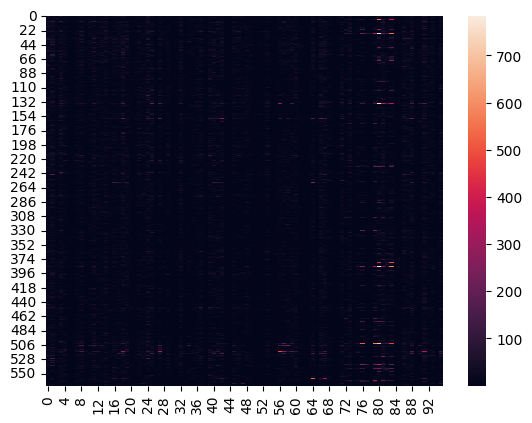

In [54]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
sns.heatmap(np.abs(E@P - mutations_np).clip(0, 1000))
plt.show()

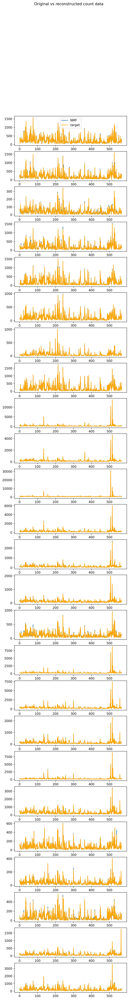

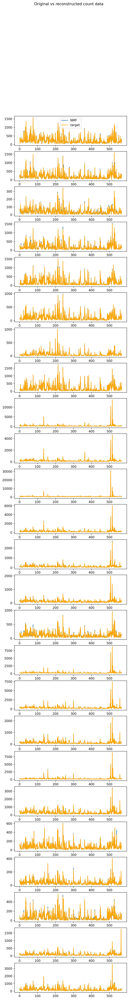

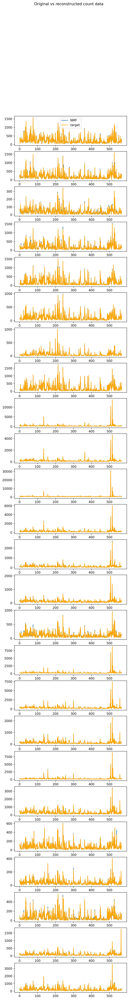

In [57]:
plt.rcParams["figure.dpi"] = 240
plt.rcParams['figure.figsize'] = [6.4, 50]

n_plots = 25
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Original vs reconstructed count data")
for i in range(n_plots):
    axs[i].plot(E@P[:,i], label="NMF")
    axs[i].plot(mutations_np[:,i], color="orange", label="target")
    if i == 0:
        axs[i].legend()
plt.show()

In [58]:
P_prob = P / P.sum(axis=1, keepdims=True)
nearest_signatures_nmfkl = get_nearest_signatures(P_prob, cosmic)

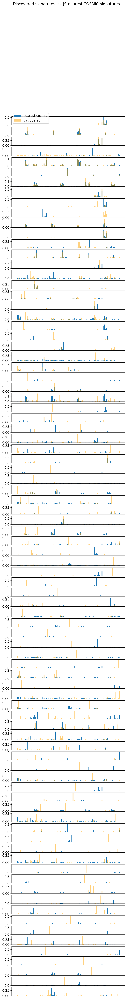

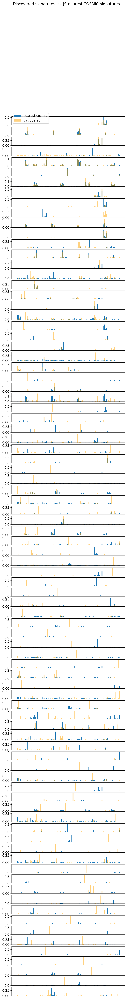

In [60]:
plt.rcParams["figure.dpi"] = 240
plt.rcParams['figure.figsize'] = [6.4, 50]

n_plots = N_SIGNATURES
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Discovered signatures vs. JS-nearest COSMIC signatures")
for i in range(n_plots):
    nearest_cosmic = cosmic[nearest_signatures[i]]
    axs[i].bar(nearest_cosmic.index, nearest_cosmic, label="nearest cosmic")
    axs[i].bar(nearest_cosmic.index, P_prob[i], color="orange", alpha=0.5, label="discovered")
    axs[i].set_xticks([])
    if i == 0:
        axs[i].legend()
plt.show()

# 2. LDA

In [78]:
# LDA
lda = LatentDirichletAllocation(
    n_components=N_SIGNATURES,
    max_iter=1000,
    learning_method="batch",
    learning_offset=10.0,
    perp_tol=1e-3,
    random_state=2137,
    n_jobs=-1,
    evaluate_every=10,
    verbose=1
)
E = lda.fit_transform(mutations_df.transpose())
P = lda.components_
P_prob_lda = lda.components_ / lda.components_.sum(axis=1, keepdims=True)

iteration: 1 of max_iter: 1000
iteration: 2 of max_iter: 1000
iteration: 3 of max_iter: 1000
iteration: 4 of max_iter: 1000
iteration: 5 of max_iter: 1000
iteration: 6 of max_iter: 1000
iteration: 7 of max_iter: 1000
iteration: 8 of max_iter: 1000
iteration: 9 of max_iter: 1000
iteration: 10 of max_iter: 1000, perplexity: 48.5880
iteration: 11 of max_iter: 1000
iteration: 12 of max_iter: 1000
iteration: 13 of max_iter: 1000
iteration: 14 of max_iter: 1000
iteration: 15 of max_iter: 1000
iteration: 16 of max_iter: 1000
iteration: 17 of max_iter: 1000
iteration: 18 of max_iter: 1000
iteration: 19 of max_iter: 1000
iteration: 20 of max_iter: 1000, perplexity: 48.4008
iteration: 21 of max_iter: 1000
iteration: 22 of max_iter: 1000
iteration: 23 of max_iter: 1000
iteration: 24 of max_iter: 1000
iteration: 25 of max_iter: 1000
iteration: 26 of max_iter: 1000
iteration: 27 of max_iter: 1000
iteration: 28 of max_iter: 1000
iteration: 29 of max_iter: 1000
iteration: 30 of max_iter: 1000, perple

In [79]:
E.shape, P.shape

((569, 86), (86, 96))

In [80]:
np.linalg.norm(((E @ P) - mutations_df.transpose()), "fro")

1929297.5779487174

In [81]:
np.abs(E@P - mutations_np).mean()

2899.860162555701

In [76]:
nearest_signatures_lda = get_nearest_signatures(P_prob_lda, cosmic)

In [ ]:
sns.hist(nearest_signatures_lda.values())

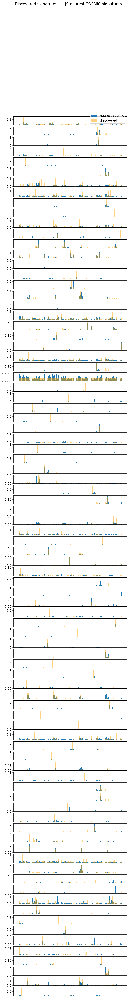

In [92]:
plt.rcParams["figure.dpi"] = 240
plt.rcParams['figure.figsize'] = [6.4, 50]

n_plots = N_SIGNATURES
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Discovered signatures vs. JS-nearest COSMIC signatures")
for i in range(n_plots):
    nearest_cosmic = cosmic[nearest_signatures_lda[i]]
    axs[i].bar(nearest_cosmic.index, nearest_cosmic, label="nearest cosmic")
    axs[i].bar(nearest_cosmic.index, P_prob_lda[i], color="orange", alpha=0.5, label="discovered")
    axs[i].set_xticks([])
    if i == 0:
        axs[i].legend()
plt.show()

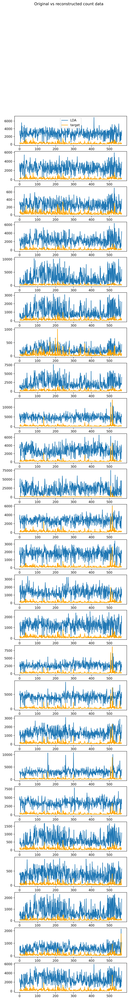

In [123]:
plt.rcParams["figure.dpi"] = 240
plt.rcParams['figure.figsize'] = [6.4, 50]

n_plots = 25
fig, axs = plt.subplots(n_plots, 1)
fig.suptitle("Original vs reconstructed count data")
for i in range(n_plots):
    axs[i].plot((E@P)[:,i], label="LDA")
    axs[i].plot(mutations_np[:,i], color="orange", label="target")
    if i == 0:
        axs[i].legend()

In [34]:
scores_lda = []
for i in tqdm(range(40, 100, 5)):
    lda = LatentDirichletAllocation(
        n_components=i,
        max_iter=1000,
        learning_method="batch",
        learning_offset=10.0,
        perp_tol=1e-3,
        random_state=2137,
        n_jobs=-1,
        evaluate_every=10
    )
    _ = lda.fit_transform(mutations_df.transpose())
    scores_lda.append(lda.perplexity(mutations_df.transpose()))

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [15:35<00:00, 77.99s/it]


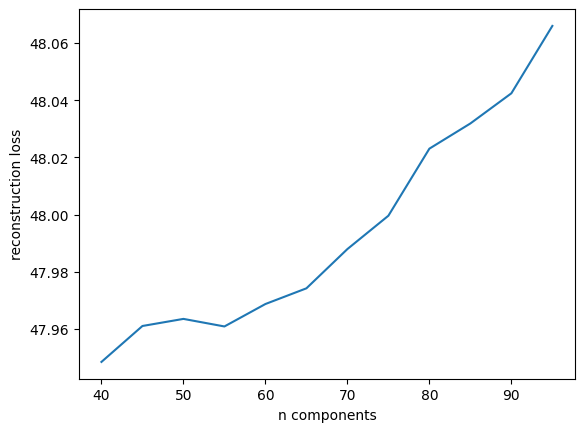

In [50]:
plt.plot(list(range(40, 100, 5)), scores_lda)
plt.xlabel("n components")
plt.ylabel("reconstruction loss")
plt.show()